<a href="https://colab.research.google.com/github/makarandv/music-emotion-recognition-/blob/master/Performance_comparison.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install librosa


In [3]:
!pip install numba

In [6]:
pip install numba==0.48

In [5]:
pip install "librosa==0.7.2"

In [8]:
#import libraries
from __future__ import print_function
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.output
import librosa.display
from scipy.spatial import distance

In [9]:
from google.colab import files
files.upload()

Saving lata.wav to lata.wav


{'lata.wav': b'RIFF$\x08\x10\x00WAVEfmt \x10\x00\x00\x00\x01\x00\x02\x00D\xac\x00\x00\x10\xb1\x02\x00\x04\x00\x10\x00data\x00\x08\x10\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x01\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x02\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\x01\x00\xff\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x01\x00\x01\x00\xff\xff\xff\xff\xff\xff\x01\x00\x02\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\xff\xff\x01\x00\x00\x00\xff\xf

In [10]:
from google.colab import files
files.upload()

Saving anuja.wav to anuja.wav


{'anuja.wav': b'RIFF$\xa8\x15\x00WAVEfmt \x10\x00\x00\x00\x01\x00\x02\x00D\xac\x00\x00\x10\xb1\x02\x00\x04\x00\x10\x00data\x00\xa8\x15\x00\x00\x00\xff\xff\x00\x00\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x01\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xff\xff\xff\xff\x00\x00\x01\x00\x01\x00\xff\xff\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x01\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x01\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xff\xff\x01\x00\x00\x00\x00\x00\xff\xff\xff\xff\x02\x00\xff\xff\xfe\xff\x01\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\x01\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00\x00\xff\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xff\x

In [11]:
from google.colab import files
files.upload()

Saving shreya.wav to shreya.wav


{'shreya.wav': b'RIFF$H\x12\x00WAVEfmt \x10\x00\x00\x00\x01\x00\x02\x00D\xac\x00\x00\x10\xb1\x02\x00\x04\x00\x10\x00data\x00H\x12\x00\x00\x00\xff\xff\x00\x00\x00\x00\xff\xff\x01\x00\x01\x00\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x00\x00\x01\x00\xff\xff\x00\x00\x01\x00\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x01\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x00\x00\x00\x00\x01\x00\xff\xff\xff\xff\x00\x00\x01\x00\x01\x00\xff\xff\xff\xff\xff\xff\x00\x00\x01\x00\xff\xff\x00\x00\x00\x00\xff\xff\x01\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00\x00\xff\xff\x01\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x01\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\xff\xff\x00\x00\x01\x00\xff\xff\x00\x00\x01\x00\xff\xff\x00\x00\x01\x00\xff\xff\xff\xff\x02\x00\x01\x00\xff\xff\x00\x00\x0

In [9]:
#load audios : original and cover song
y1 , sr1 = librosa.load('anuja.wav')
y2 , sr2 = librosa.load('lata.wav')
y3 , sr3 = librosa.load('shreya.wav')

In [10]:
# Compute the spectrogram magnitude and phase
S_full_1, phase_1 = librosa.magphase(librosa.stft(y1))
S_full_2, phase_2 = librosa.magphase(librosa.stft(y2))
S_full_3, phase_3 = librosa.magphase(librosa.stft(y3))

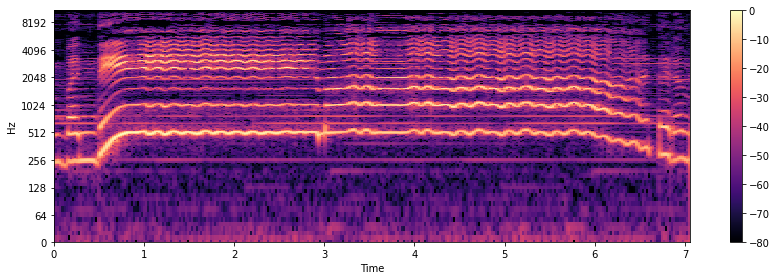

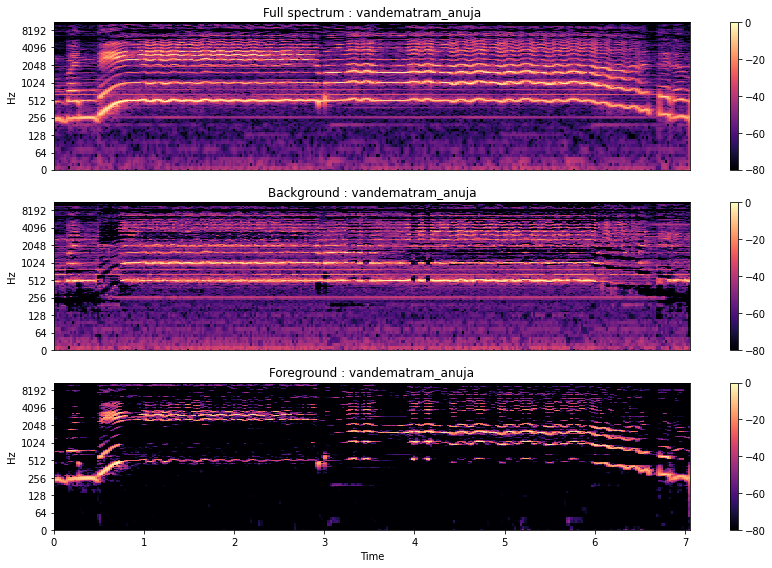

In [11]:
'''SONG 1: vandematramanuja'''
#parameters: S_full_1, phase_1 , y1 , sr1
#plot slice 
idx_1 = slice(*librosa.time_to_frames([1, 11], sr=sr1))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full_1[:, idx_1], ref=np.max), y_axis='log', x_axis='time', sr=sr1)
plt.colorbar()
plt.tight_layout()

S_filter_1 = librosa.decompose.nn_filter(S_full_1,aggregate=np.median, metric='cosine',width=int(librosa.time_to_frames(2, sr=sr1)))
S_filter_1 = np.minimum(S_full_1, S_filter_1)
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation
margin_i_1, margin_v_1 = 2, 10
power_1 = 2
mask_i_1 = librosa.util.softmask(S_filter_1,margin_i_1 * (S_full_1 - S_filter_1),power=power_1)
mask_v_1 = librosa.util.softmask(S_full_1 - S_filter_1, margin_v_1 * S_filter_1,power=power_1)
# Once we have the masks, simply multiply them with the input spectrum
# to separate the components
S_foreground_1 = mask_v_1 * S_full_1
S_background_1 = mask_i_1 * S_full_1 
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full_1[:, idx_1], ref=np.max), y_axis='log', sr=sr1)
plt.title('Full spectrum : vandematram_anuja')
plt.colorbar()
plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background_1[:, idx_1], ref=np.max),y_axis='log', sr=sr1)
plt.title('Background : vandematram_anuja')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground_1[:, idx_1], ref=np.max),y_axis='log', x_axis='time', sr=sr1)
plt.title('Foreground : vandematram_anuja')
plt.colorbar()
plt.tight_layout()
plt.show()

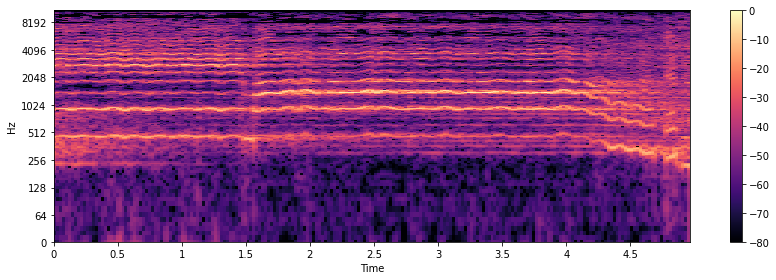

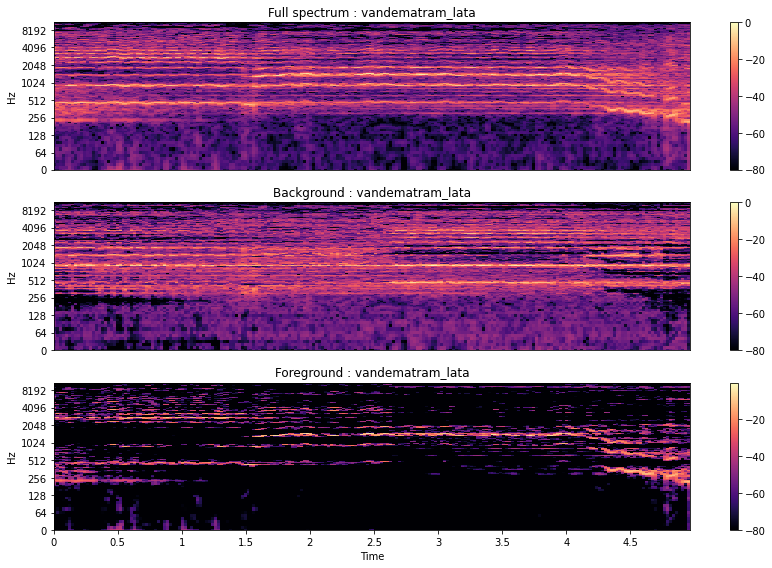

In [12]:
'''SONG 2: vandematramlata'''
#parameters: S_full_1, phase_1 , y1 , sr1
#plot slice 
idx_2 = slice(*librosa.time_to_frames([1, 11], sr=sr2))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full_2[:, idx_2], ref=np.max), y_axis='log', x_axis='time', sr=sr2)
plt.colorbar()
plt.tight_layout()

S_filter_2 = librosa.decompose.nn_filter(S_full_2,aggregate=np.median, metric='cosine',width=int(librosa.time_to_frames(2, sr=sr2)))
S_filter_2 = np.minimum(S_full_2, S_filter_2)
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation
margin_i_2, margin_v_2 = 2, 10
power_2 = 2
mask_i_2 = librosa.util.softmask(S_filter_2,margin_i_2 * (S_full_2 - S_filter_2),power=power_2)
mask_v_2 = librosa.util.softmask(S_full_2 - S_filter_2, margin_v_2 * S_filter_2,power=power_2)
# Once we have the masks, simply multiply them with the input spectrum
# to separate the components
S_foreground_2 = mask_v_2 * S_full_2
S_background_2 = mask_i_2 * S_full_2 
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full_2[:, idx_2], ref=np.max), y_axis='log', sr=sr2)
plt.title('Full spectrum : vandematram_lata')
plt.colorbar()
plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background_2[:, idx_2], ref=np.max),y_axis='log', sr=sr2)
plt.title('Background : vandematram_lata')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground_2[:, idx_2], ref=np.max),y_axis='log', x_axis='time', sr=sr2)
plt.title('Foreground : vandematram_lata')
plt.colorbar()
plt.tight_layout()
plt.show()


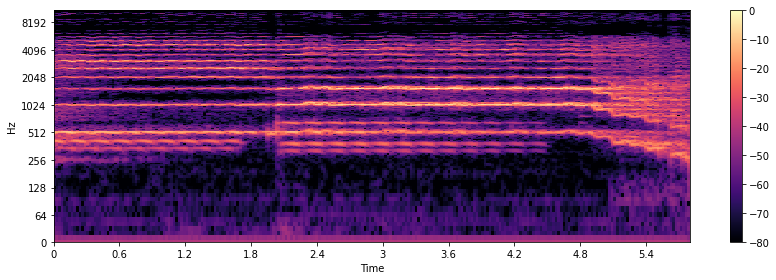

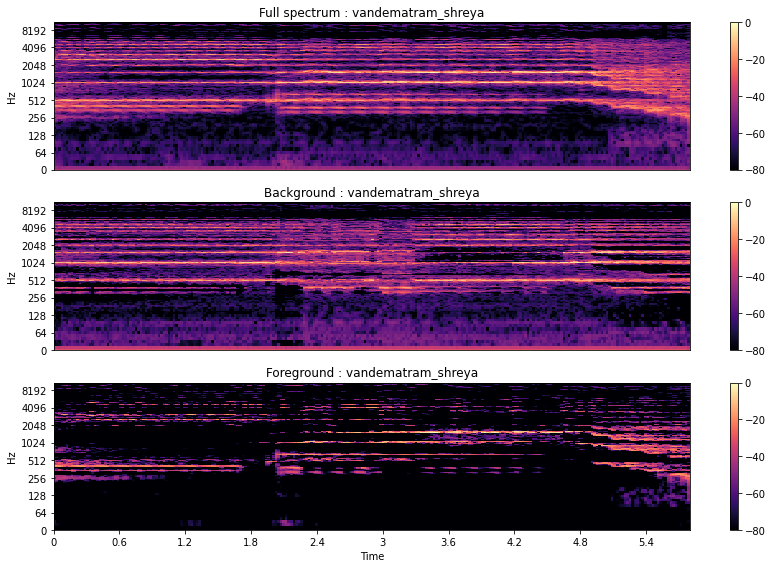

In [13]:

'''SONG 3: vandematramshreya'''
#parameters: S_full_1, phase_1 , y1 , sr1
#plot slice 
idx_3 = slice(*librosa.time_to_frames([1, 11], sr=sr3))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full_3[:, idx_3], ref=np.max), y_axis='log', x_axis='time', sr=sr3)
plt.colorbar()
plt.tight_layout()

S_filter_3 = librosa.decompose.nn_filter(S_full_3,aggregate=np.median, metric='cosine',width=int(librosa.time_to_frames(2, sr=sr3)))
S_filter_3 = np.minimum(S_full_3, S_filter_3)
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation
margin_i_3, margin_v_3 = 2, 10
power_3 = 2
mask_i_3 = librosa.util.softmask(S_filter_3,margin_i_3 * (S_full_3 - S_filter_3),power=power_3)
mask_v_3 = librosa.util.softmask(S_full_3 - S_filter_3, margin_v_3 * S_filter_3,power=power_3)
# Once we have the masks, simply multiply them with the input spectrum
# to separate the components
S_foreground_3 = mask_v_3 * S_full_3
S_background_3 = mask_i_3 * S_full_3 
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full_3[:, idx_3], ref=np.max), y_axis='log', sr=sr3)
plt.title('Full spectrum : vandematram_shreya')
plt.colorbar()
plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background_3[:, idx_3], ref=np.max),y_axis='log', sr=sr3)
plt.title('Background : vandematram_shreya')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground_3[:, idx_3], ref=np.max),y_axis='log', x_axis='time', sr=sr3)
plt.title('Foreground : vandematram_shreya')
plt.colorbar()
plt.tight_layout()
plt.show()



In [14]:
''' COMPARISON '''
voc_anuja= S_foreground_1
voc_lata= S_foreground_2
voc_shreya= S_foreground_3
print("Dimensions of vandematram_anuja song vocals:",voc_anuja.shape)
print("Dimensions of vandematram_lata song vocals:",voc_lata.shape)
print("Dimensions of vandematram_shreya song vocals:",voc_shreya.shape)
type(voc_anuja)

Dimensions of vandematram_anuja song vocals: (1025, 347)
Dimensions of vandematram_lata song vocals: (1025, 257)
Dimensions of vandematram_shreya song vocals: (1025, 293)


numpy.ndarray

In [15]:
#shaping and padding

voc1=voc_anuja.flatten()
voc2=voc_lata.flatten()
voc3=voc_shreya.flatten()

vocl1=list(voc1)
vocl2=list(voc2)
vocl3=list(voc3)

dim1=len(vocl1)
dim2=len(vocl2)
dim3=len(vocl3)

large=max(dim1,dim2,dim3)
print(large)

diff1=large-dim1
diff2=large-dim2
diff3=large-dim3

for i in range (diff1):
    vocl1.append(0)

for j in range (diff2):
    vocl2.append(0)   
    
for k in range (diff3):
    vocl3.append(0)
    
len(vocl1)
len(vocl2)
len(vocl3)

355675


355675

In [16]:
### Using euclidean with padding
from scipy.spatial.distance import euclidean
import time

start1=time.time()
diste12=distance.euclidean(vocl1, vocl2)
stop1=time.time()
print("Euclidean distance between vandemataram by anuja, lata:",diste12)

diste23=distance.euclidean(vocl2, vocl3)
print("Euclidean distance between vandemataram by shreya, lata:",diste23)
diste31=distance.euclidean(vocl1, vocl3)
print("Euclidean distance between vandemataram by anuja, shreya:",diste31)

#Similarity between vocals
s1=set(voc1)
s2=set(voc2)
s3=set(voc3)

m12=(len(s1&s2))
m23=(len(s3&s2))
m13=(len(s1&s3))
print("Similarity index between vandemataram by anuja, lata:",m12)
print("Similarity index between vandemataram by sherya, lata:",m23)
print("Similarity index between vandemataram by anuja, shreya:",m13)

print("#####################")




Euclidean distance between vandemataram by anuja, lata: 3189.178900454466
Euclidean distance between vandemataram by shreya, lata: 2735.087150491514
Euclidean distance between vandemataram by anuja, shreya: 1878.7918019332294
Similarity index between vandemataram by anuja, lata: 113
Similarity index between vandemataram by sherya, lata: 104
Similarity index between vandemataram by anuja, shreya: 132
#####################


In [17]:
###### Using DTW with padding
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw

#dtw distance
start2=time.time()
distance0, path0 = fastdtw(vocl1, vocl2, dist=euclidean)
print(distance0)
stop2=time.time()

distance1, path1 = fastdtw(vocl2, vocl3, dist=euclidean)
print(distance1)

distance2, path2 = fastdtw(vocl1, vocl3, dist=euclidean)
print(distance2)


print("Dtw distance between vandemataram by anuja, lata:",distance0)
print("Dtw distance between vandemataram by shreya, lata:",distance1)
print("Dtw distance between vandemataram by anuja, shreya:",distance2)

197242.52424178337
172617.2654716481
140813.16854392784
Dtw distance between vandemataram by anuja, lata: 197242.52424178337
Dtw distance between vandemataram by shreya, lata: 172617.2654716481
Dtw distance between vandemataram by anuja, shreya: 140813.16854392784


In [18]:
### Using dtw without padding using fastdw
v1=list(voc1)
v2=list(voc2)
v3=list(voc3)

start3=time.time()
dis12, path12 = fastdtw(v1, v2, dist=euclidean)
stop3=time.time()
print("Dtw distance without padding between vandemataram by anuja, lata:",dis12)

dis23, path23 = fastdtw(v3, v2, dist=euclidean)
print("Dtw distance without padding between vandemataram by anuja, lata:",dis23)
dis13, path13 = fastdtw(v1, v3, dist=euclidean)
print("Dtw distance without padding between vandemataram by anuja, lata:",dis13)


Dtw distance without padding between vandemataram by anuja, lata: 197327.3223173963
Dtw distance without padding between vandemataram by anuja, lata: 175890.73910202298
Dtw distance without padding between vandemataram by anuja, lata: 140838.43808963682


In [19]:
#comparison between methods
print("Time comparisons between different methods for case 1 ")
print("time taken for euclidean distance: ",(stop1-start1)/60," minutes")
print("time taken for dtw distance: ",(stop2-start2)/60," minutes")
print("time taken for dtw distance without padding: ",(stop3-start3)/60," minutes")
print("======================================")


Time comparisons between different methods for case 1 
time taken for euclidean distance:  0.0013212442398071289  minutes
time taken for dtw distance:  1.8648144086201985  minutes
time taken for dtw distance without padding:  1.6182550032933554  minutes


In [20]:
#distance comparison between different methods
print("Comparison between songs by anuja & lata: ")
print("Euclidean distance= ", diste12)
print("DTW distance=", distance0 )
print("DTW distance without padding=", dis12 )
print("======================================")

print("Comparison between songs by shreya & lata: ")
print("Euclidean distance= ", diste23)
print("DTW distance=", distance1)
print("DTW distance without padding=", dis23)
print("======================================")

print("Comparison between songs by anuja & shreya: ")
print("Euclidean distance= ", diste31)
print("DTW distance=", distance2)
print("DTW distance without padding=", dis13)
print("======================================")


Comparison between songs by anuja & lata: 
Euclidean distance=  3189.178900454466
DTW distance= 197242.52424178337
DTW distance without padding= 197327.3223173963
Comparison between songs by shreya & lata: 
Euclidean distance=  2735.087150491514
DTW distance= 172617.2654716481
DTW distance without padding= 175890.73910202298
Comparison between songs by anuja & shreya: 
Euclidean distance=  1878.7918019332294
DTW distance= 140813.16854392784
DTW distance without padding= 140838.43808963682


Text(0, 0.5, 'energy')

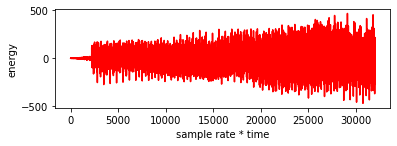

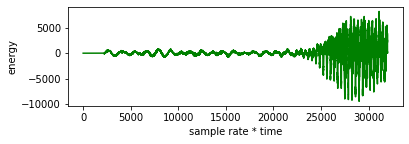

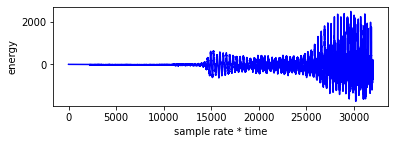

In [21]:
#Plotting seperate graphs
import wave
import numpy as np
import matplotlib.pyplot as plt

signal_wave_1 = wave.open('anuja.wav', 'r')
sample_rate = 16000
sig_1 = np.frombuffer(signal_wave_1.readframes(sample_rate), dtype=np.int16)
sig_1 = sig_1[:]
plt.figure(1)
plot_a = plt.subplot(211)
plot_a.plot(sig_1,color="r")
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')

signal_wave_2 = wave.open('lata.wav', 'r')
sample_rate = 16000
sig_2 = np.frombuffer(signal_wave_2.readframes(sample_rate), dtype=np.int16)
sig_2 = sig_2[:]
plt.figure(2)
plot_b = plt.subplot(211)
plot_b.plot(sig_2,color="g")
plot_b.set_xlabel('sample rate * time')
plot_b.set_ylabel('energy')

signal_wave_3 = wave.open('shreya.wav', 'r')
sample_rate = 16000
sig_3 = np.frombuffer(signal_wave_3.readframes(sample_rate), dtype=np.int16)
sig_3 = sig_3[:]
plt.figure(3)
plot_c = plt.subplot(211)
plot_c.plot(sig_3,color="b")
plot_c.set_xlabel('sample rate * time')
plot_c.set_ylabel('energy')

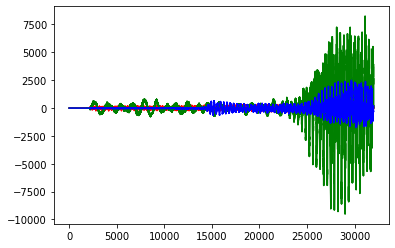

In [22]:
#Combined Plots
plt.plot(sig_2,color="g")
plt.plot(sig_1,color="r")

plt.plot(sig_2,color="g")
plt.plot(sig_3,color="b")

In [23]:
''' CODE BELOW THIS POINT IS ONLY FOR TRIAL'''

voc_anuja.shape
voc_lata.shape
import scipy
from scipy import spatial
from scipy.spatial import distance
from scipy.spatial.distance import cdist




In [24]:
voc1.shape
voc2.shape
one=voc1[:,np.newaxis]
one.shape
two=voc2[:,np.newaxis]

vone= one.transpose()
vone.shape

vtwo= two.transpose()
vtwo.shape



(1, 263425)

In [34]:
#diste12=distance.euclidean(vone, vtwo)
diste12=distance.hamming(vocl1, vocl2)
print("hamming distance")
print(diste12)
#np.dot(vone,vtwo)
#distry=cdist(vone, vtwo, metric='hamming')
#print(vocl1)
#distry=cdist(vocl1, vocl2, metric='hamming')
#print(distry)

hamming distance
0.6280677584873832


In [ ]:
''' CHROMAGRAM METHOD '''
y_harmonic1, y_percussive1 = librosa.effects.hpss(y1)
chromagram1 = librosa.feature.chroma_cqt(y=y_harmonic1, sr=sr1)
type(chromagram1)

y_harmonic2, y_percussive2 = librosa.effects.hpss(y2)
chromagram2 = librosa.feature.chroma_cqt(y=y_harmonic2, sr=sr2)

y_harmonic3, y_percussive3 = librosa.effects.hpss(y3)
chromagram3 = librosa.feature.chroma_cqt(y=y_harmonic3, sr=sr3)

chromagram1.shape
chromagram2.shape
chromagram3.shape

###############################
chr1=chromagram1.flatten()
chr2=chromagram2.flatten()
chr3=chromagram3.flatten()

c1=list(chr1)
c2=list(chr2)
c3=list(chr3)

dimension1=len(c1)
dimension2=len(c2)
dimension3=len(c3)

larger=max(dimension1,dimension2,dimension3)
print(larger)

diffr1=larger-dimension1
diffr2=larger-dimension2
diffr3=larger-dimension3

for i in range (diffr1):
    c1.append(0)

for j in range (diffr2):
    c2.append(0)   
    
for k in range (diffr3):
    c3.append(0)
    
len(c1)
len(c2)
len(c3)

###############################
from scipy.spatial.distance import hamming

start4=time.time()
distc1=distance.euclidean(c1,c2)
stop4=time.time()

distc2=distance.euclidean(c2, c3)
distc3=distance.euclidean(c1, c3)

print("=====================================================")
print("CHROMA METHOD")
print("distance between cov1, cov2:",distc1)
print("distance between vandemataram by cov2, org:",distc2)
print("distance between vandemataram by cov1, org:",distc3)
print("Time taken for  : ",(stop4-start4)/60," minutes")

4176
CHROMA METHOD
distance between cov1, cov2: 28.183431979099957
distance between vandemataram by cov2, org: 27.653258743685356
distance between vandemataram by cov1, org: 25.133817592056538
Time taken for  :  2.7350584665934245e-05  minutes
